<a href="https://colab.research.google.com/github/kunalrajsingh/Deep-Learning_Image-Colorization-Using-GAN-Techniques/blob/main/Grayscale_image_Colorization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# New Section

In [ ]:
import numpy as np
import h5py
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from tensorflow.keras.layers import Input,Dense,Reshape,Conv2D,Dropout,multiply,Dot,Concatenate,subtract,ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization,LeakyReLU,Flatten
from tensorflow.keras.layers import Conv2DTranspose as Deconv2d
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# from google.colab import files
from keras import backend as K
import smtplib

from sklearn.utils import shuffle

In [ ]:
import tensorflow as tf
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from keras.preprocessing.image import img_to_array

In [ ]:
import os
os.environ["KAGGLE_CONFIG_DIR"]="/content/drive/MyDrive/Kaggle"

In [ ]:
! kaggle datasets download -d theblackmamba31/landscape-image-colorization

Dataset URL: https://www.kaggle.com/datasets/theblackmamba31/landscape-image-colorization
License(s): unknown
landscape-image-colorization.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip /content/landscape-image-colorization.zip

Archive:  /content/landscape-image-colorization.zip
replace landscape Images/color/0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
from google.colab import drive

# Check if the drive is already mounted
import os
if not os.path.exists('/content/drive'):
  drive.mount('/content/drive')
else:
  print("Drive is already mounted.")

Drive is already mounted.


In [ ]:
!mkdir /content/drive_new

mkdir: cannot create directory ‘/content/drive_new’: File exists


In [ ]:
!df -h
  # Check mounted drives and space used.
!fusermount -u /content/drive  # Unmounts the existing drive

Filesystem      Size  Used Avail Use% Mounted on
overlay         226G   16G  210G   7% /
tmpfs            64M     0   64M   0% /dev
shm             165G     0  165G   0% /dev/shm
/dev/root       2.0G  1.2G  820M  59% /usr/sbin/docker-init
tmpfs           168G  496K  168G   1% /var/colab
/dev/sda1       233G   31G  202G  14% /etc/hosts
tmpfs           168G     0  168G   0% /proc/acpi
tmpfs           168G     0  168G   0% /proc/scsi
tmpfs           168G     0  168G   0% /sys/firmware
drive           226G   27G  200G  12% /content/drive_new
fusermount: failed to unmount /content/drive: Invalid argument


In [ ]:
from google.colab import drive
drive.mount('/content/drive_new')

Drive already mounted at /content/drive_new; to attempt to forcibly remount, call drive.mount("/content/drive_new", force_remount=True).


In [ ]:
# to get the files in proper order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
color_img = []
path = '/content/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
        if i == '2200.jpg':
            break
        else:
            img = cv2.imread(path + '/'+i,1)
            # open cv reads images in BGR format so we have to convert it to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (SIZE, SIZE))
            img = img.astype('float32') / 255.0
            color_img.append(img_to_array(img))


gray_img = []
path = '/content/landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
         if i == '2200.jpg':
            break
         else:
            img = cv2.imread(path + '/'+i,1)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (SIZE, SIZE))
            img = img.astype('float32') / 255.0
            gray_img.append(img_to_array(img))

 31%|███       | 2200/7129 [00:02<00:04, 1084.41it/s]


In [ ]:
color_dataset=tf.data.Dataset.from_tensor_slices(np.array(color_img[:2000])).batch(64)
gray_dataset=tf.data.Dataset.from_tensor_slices(np.array(gray_img[:2000])).batch(64)

color_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(color_img[2000:])).batch(8)
gray_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(gray_img[2000:])).batch(8)

In [ ]:
example_color = next(iter(color_dataset))
example_gray = next(iter(gray_dataset))

In [ ]:
def plot_images(a = 4):

    for i in range(a):
        plt.figure(figsize = (10,10))
        plt.subplot(121)
        plt.title('color')
        plt.imshow(example_color[i] )

        plt.subplot(122)
        plt.title('gray')
        plt.imshow(example_gray[i])
        plt.show()

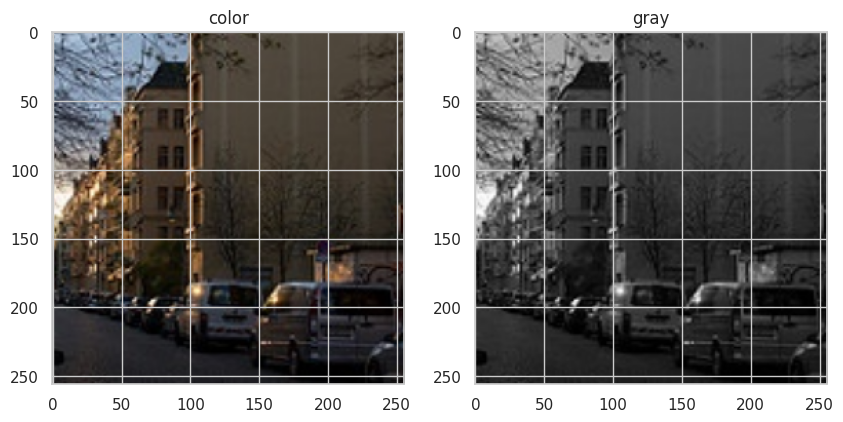

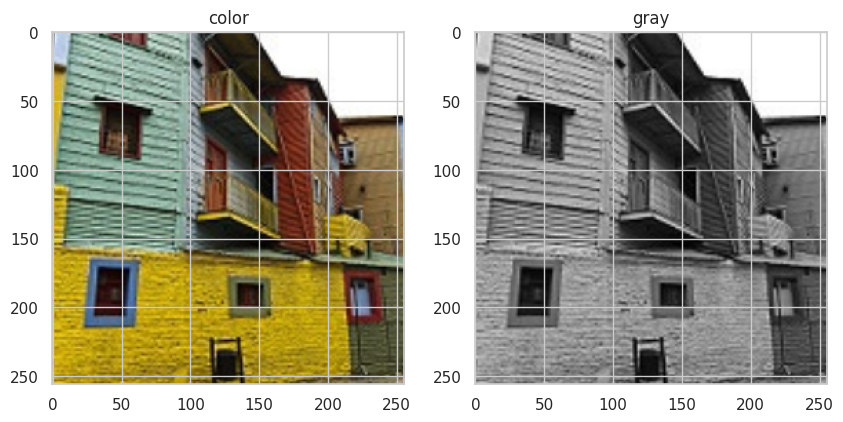

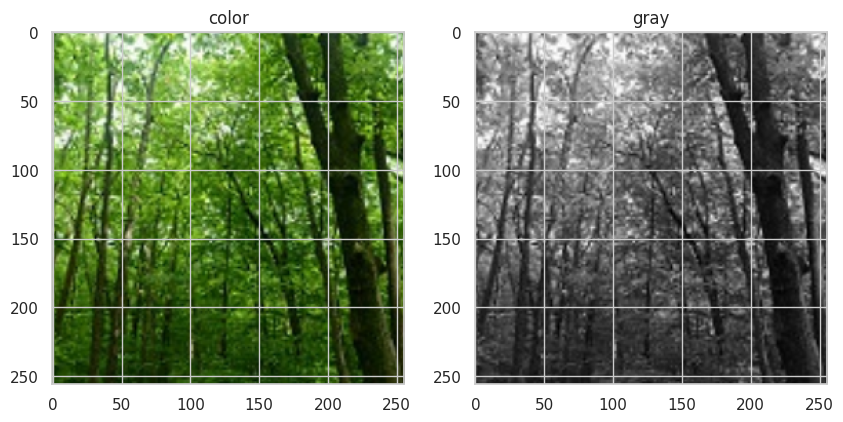

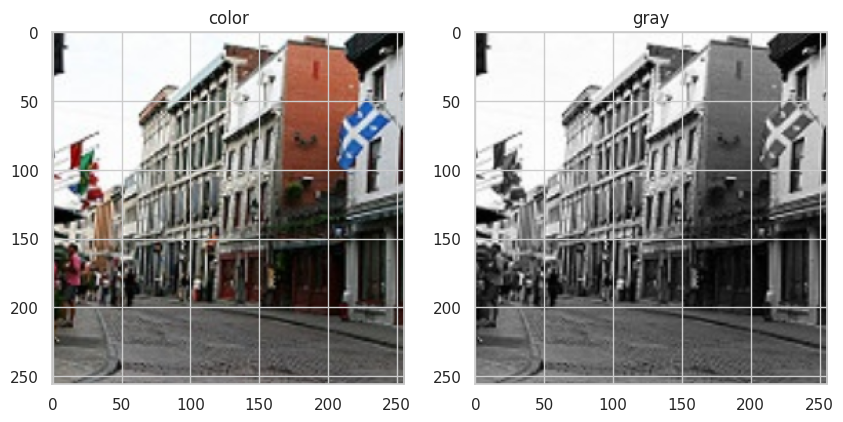

In [ ]:
plot_images(4)

In [ ]:
def downsample(filters, size, apply_batchnorm=True):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',kernel_initializer='he_normal', use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())
  return result

def upsample(filters, size, apply_dropout=False):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,padding='same',kernel_initializer='he_normal',use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(3, 4,strides=2,padding='same',kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [ ]:
generator = Generator()
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 sequential (Sequential)     (None, 128, 128, 64)         3072      ['input_1[0][0]']             
                                                                                                  
 sequential_1 (Sequential)   (None, 64, 64, 128)          131584    ['sequential[0][0]']          
                                                                                                  
 sequential_2 (Sequential)   (None, 32, 32, 256)          525312    ['sequential_1[0][0]']        
                                                                                              

In [ ]:
discriminator = Discriminator()
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 concatenate_7 (Concatenate  (None, 256, 256, 6)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_15 (Sequential)  (None, 128, 128, 64)         6144      ['concatenate_7[0][0]'] 

In [ ]:
genLoss=[]
discLoss=[]

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)
  genLoss.append(total_gen_loss)

  return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss
  discLoss.append(total_disc_loss)

  return total_disc_loss

In [ ]:
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

In [ ]:
import time
def fit(train_ds, epochs,):
  for epoch in range(epochs):
    start = time.time()
    print("Epoch: ", epoch+1)
    # Train
    for n, (input_image, target) in train_ds.enumerate():
      train_step(input_image, target, epoch)
    print()
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))

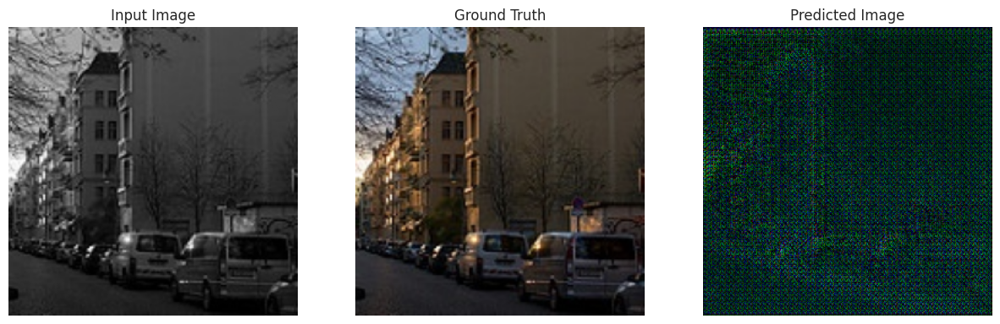

(64, 256, 256, 3)


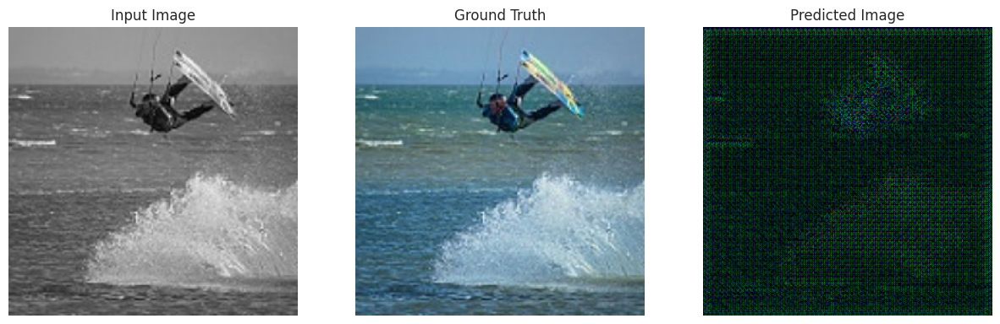

(64, 256, 256, 3)


In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(2):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

In [ ]:
hist=fit(tf.data.Dataset.zip((gray_dataset, color_dataset)), epochs = 2)

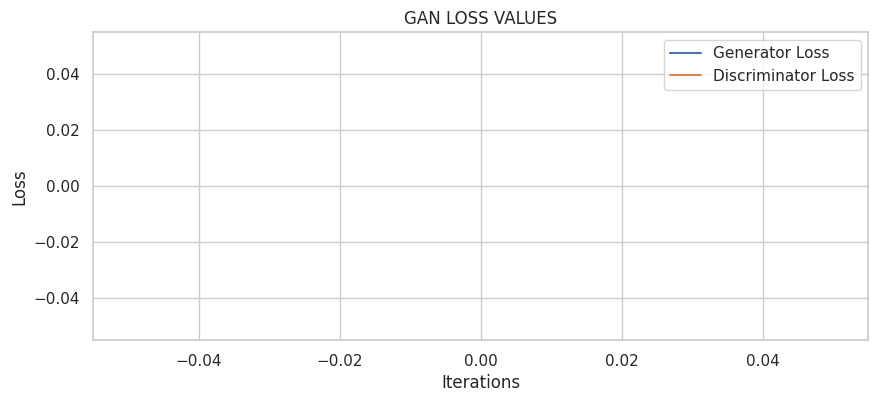

In [ ]:
import seaborn as sns
sns.set(style='whitegrid')
plt.figure(figsize=(10,4))
plt.plot(genLoss, label="Generator Loss")
plt.plot(discLoss, label="Discriminator Loss")
plt.title("GAN LOSS VALUES")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


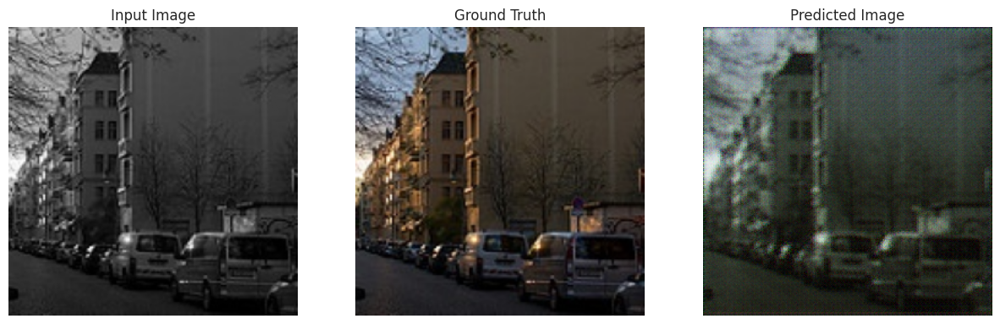

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


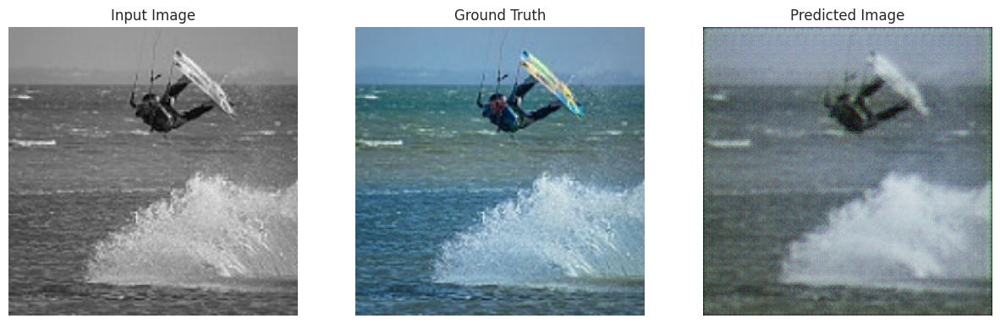

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


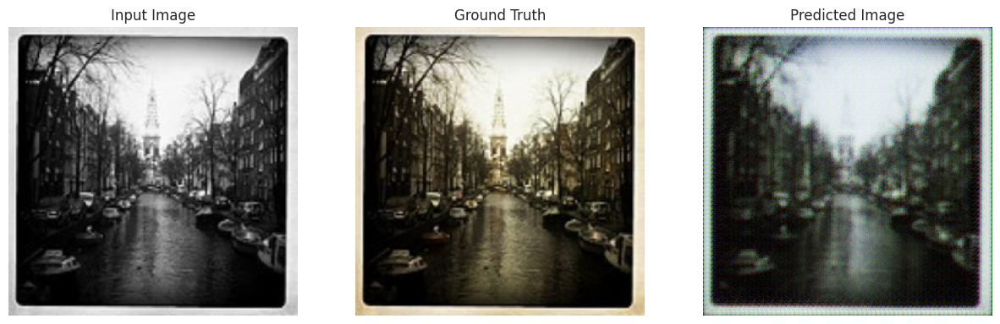

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


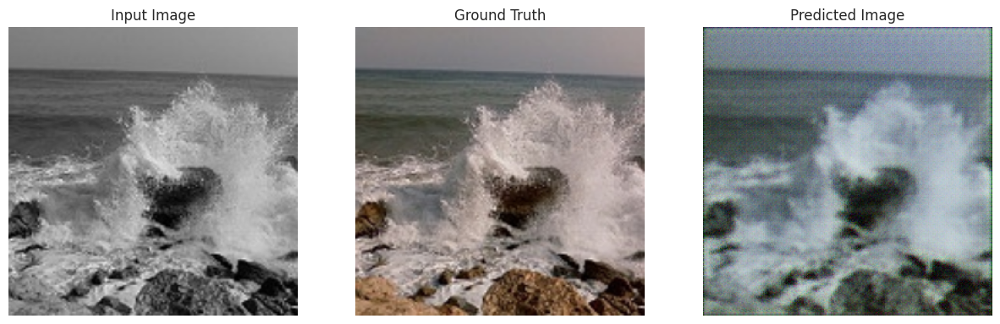

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


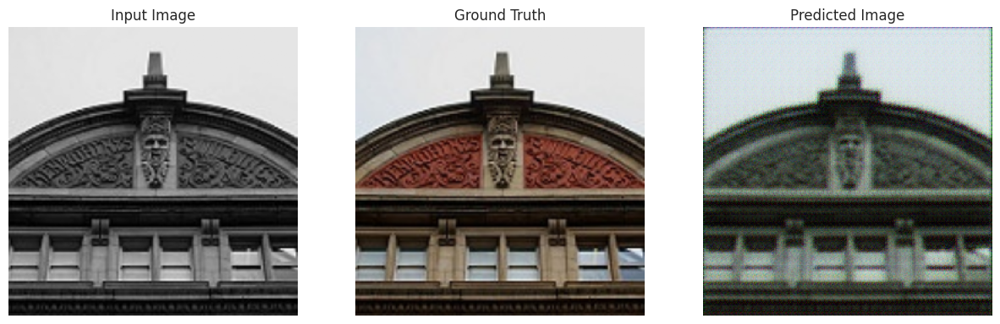

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


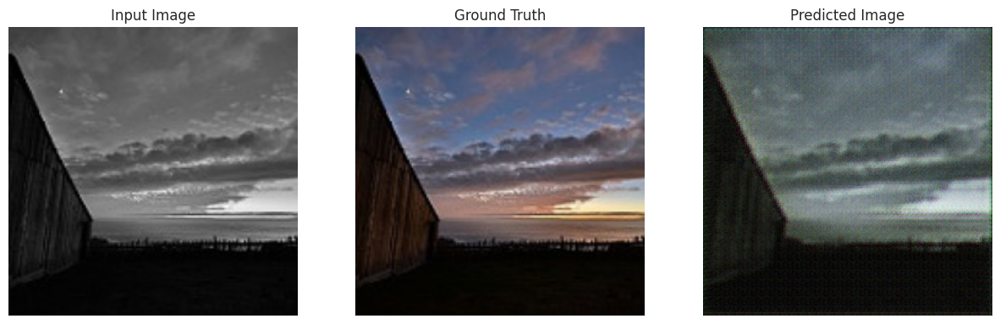

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


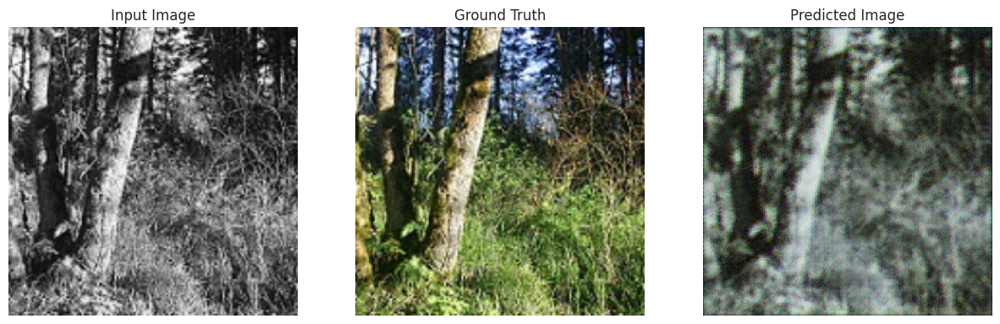

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


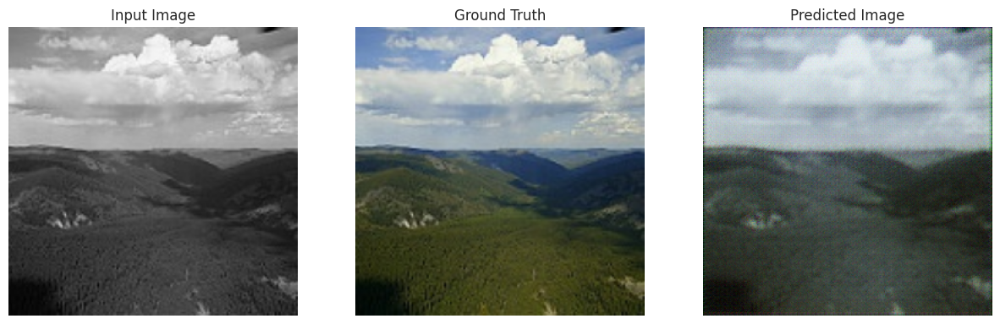

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


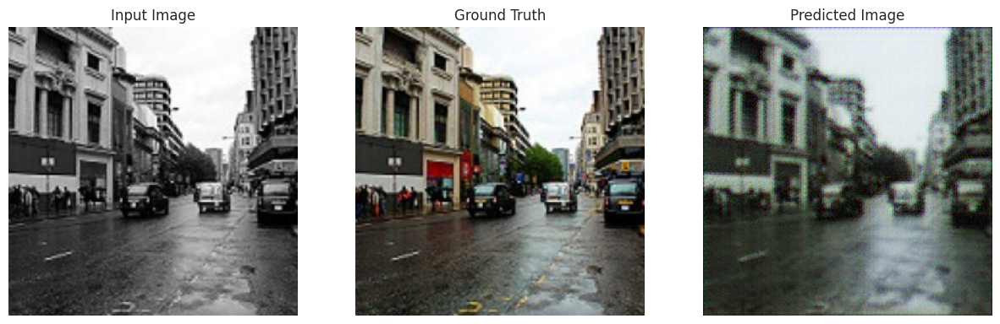

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


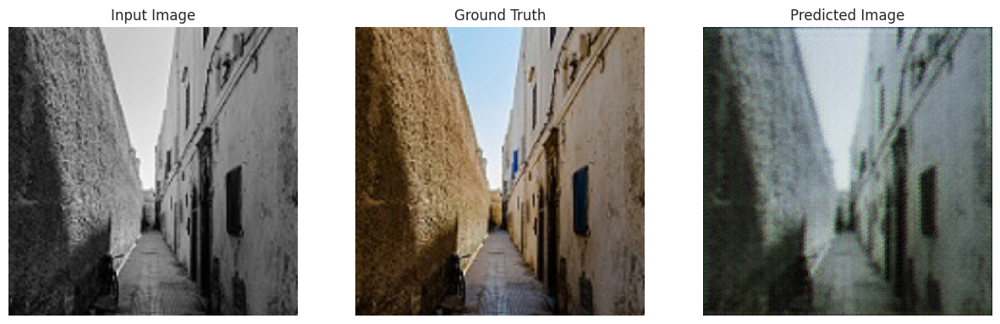

(64, 256, 256, 3)


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


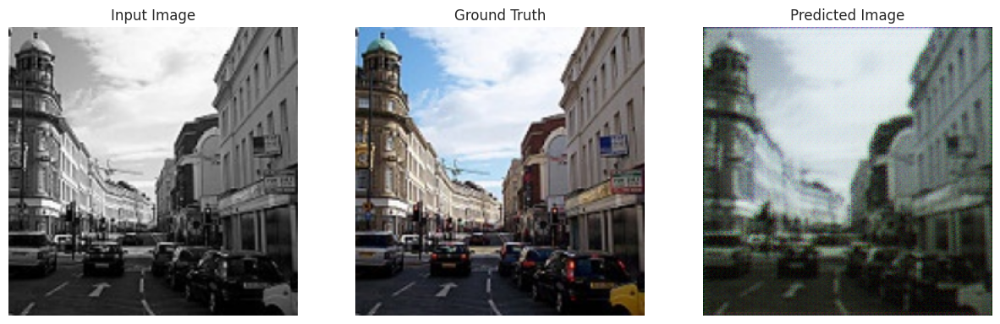

(64, 256, 256, 3)


In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    print(test_input[0].shape)
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(11):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

In [ ]:
import cv2
import os
img2 = cv2.imread("/content/Tesla Cyber Truck.jpg").astype("float32")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Define the desired size for the image
SIZE = 256  # Example size, you can change it to your desired value

try:
    img2 = img2.reshape(1, SIZE, SIZE, 3)
except:
    img2 = cv2.resize(img2, (SIZE, SIZE))
    img2 = img2.reshape(1, SIZE, SIZE, 3)

In [ ]:
img2 = img2.reshape(1, SIZE, SIZE, 3)

In [ ]:
img2.shape

(1, 256, 256, 3)

In [ ]:
img2

array([[[[ 44.      ,  41.      ,  33.      ],
         [ 44.      ,  41.      ,  33.      ],
         [ 45.      ,  42.      ,  34.      ],
         ...,
         [ 79.      ,  74.      ,  62.      ],
         [ 81.      ,  73.      ,  64.      ],
         [ 77.      ,  73.25    ,  64.5     ]],

        [[ 44.      ,  41.      ,  33.      ],
         [ 44.      ,  41.      ,  33.      ],
         [ 45.      ,  42.      ,  34.      ],
         ...,
         [ 80.      ,  76.      ,  64.      ],
         [ 81.      ,  73.      ,  64.      ],
         [ 78.      ,  74.88428 ,  64.231445]],

        [[ 44.      ,  41.      ,  33.      ],
         [ 44.      ,  41.      ,  33.      ],
         [ 45.      ,  42.      ,  34.      ],
         ...,
         [ 82.      ,  77.      ,  65.      ],
         [ 82.      ,  75.      ,  64.      ],
         [ 78.      ,  75.      ,  62.      ]],

        ...,

        [[ 53.07617 ,  50.07617 ,  44.07617 ],
         [ 53.07617 ,  50.07617 ,  44.07617 ]

In [ ]:
img2[0] = img2[0]/255.0

In [ ]:
img2

array([[[[0.17254902, 0.16078432, 0.12941177],
         [0.17254902, 0.16078432, 0.12941177],
         [0.1764706 , 0.16470589, 0.13333334],
         ...,
         [0.30980393, 0.2901961 , 0.24313726],
         [0.31764707, 0.28627452, 0.2509804 ],
         [0.3019608 , 0.2872549 , 0.2529412 ]],

        [[0.17254902, 0.16078432, 0.12941177],
         [0.17254902, 0.16078432, 0.12941177],
         [0.1764706 , 0.16470589, 0.13333334],
         ...,
         [0.3137255 , 0.29803923, 0.2509804 ],
         [0.31764707, 0.28627452, 0.2509804 ],
         [0.30588236, 0.29366383, 0.251888  ]],

        [[0.17254902, 0.16078432, 0.12941177],
         [0.17254902, 0.16078432, 0.12941177],
         [0.1764706 , 0.16470589, 0.13333334],
         ...,
         [0.32156864, 0.3019608 , 0.25490198],
         [0.32156864, 0.29411766, 0.2509804 ],
         [0.30588236, 0.29411766, 0.24313726]],

        ...,

        [[0.20814185, 0.19637714, 0.17284773],
         [0.20814185, 0.19637714, 0.17284773]

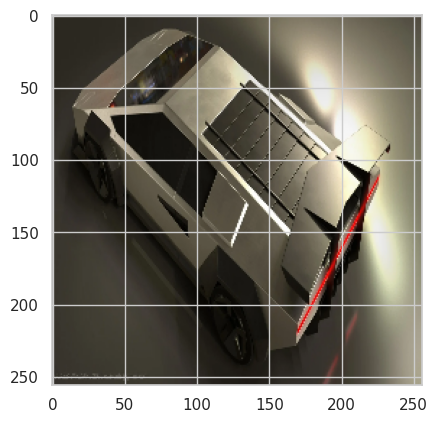

In [ ]:
plt.imshow(img2[0])

In [ ]:
!pip install scikit-image
from skimage.transform import resize

def generate_images(generator, input_img1, input_img2):
    """
    Generates images using the provided generator model.

    Args:
        generator: The generator model.
        input_img1: The first input image.
        input_img2: The second input image.

    Returns:
        The generated images.
    """
    # ... (rest of your generate_images function) ...

    if input_img1.shape[1] != 100:
        # Resizing the input images using skimage.transform.resize
        input_img1 = resize(input_img1, (1, 100, input_img1.shape[2], input_img1.shape[3])) # Assuming the original shape was (1, 256, 256, 3)
        input_img2 = resize(input_img2, (1, 100, input_img2.shape[2], input_img2.shape[3])) # Assuming the original shape was (1, 256, 256, 3)

    # ... (rest of your generate_images function) ...

In [ ]:
Pred=generate_images(generator,img2, img2)

In [ ]:
import numpy as np

def generate_images(generator, input_img1, input_img2):
    """Generates an image using the given generator model and two input images.

    Args:
        generator: The generator model.
        input_img1: The first input image.
        input_img2: The second input image.

    Returns:
        The generated image.
    """

    # Reshape input_img1 and input_img2 to (1, 100)
    input_img1 = input_img1.reshape(1, -1)
    input_img2 = input_img2.reshape(1, -1)

    # If the reshaped images do not have 100 features, resize them
    if input_img1.shape[1] != 100:
        # Assuming you have a function like resize or you can adjust the logic here
        input_img1 = resize(input_img1, (1, 100))
        input_img2 = resize(input_img2, (1, 100))


    # Combine the two input images if necessary
    # Adjust this based on your generator's expected input.
    # If your generator expects two separate inputs,
    # modify this to feed them as separate arguments to generator.predict
    combined_input = np.concatenate([input_img1, input_img2], axis=1) # adjust if necessary

    # Generate output using the generator model
    generated_img = generator.predict(combined_input)

    # ... rest of your generate_images function ...

    return generated_img

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_images(generator, input_img1, input_img2):
    # Assuming generator expects input shape of (1, height, width, channels)
    img1 = np.expand_dims(input_img1, axis=0)
    img2 = np.expand_dims(input_img2, axis=0)

    # Generate the image (or output) using the generator
    generated_img = generator.predict([img1, img2])

    # Plot the generated image
    plt.imshow(np.clip(generated_img[0], 0, 1))
    plt.axis('off')
    plt.show()

    return generated_img


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_images(generator, input_img1, input_img2):
    # Ensure inputs have the correct shape (1, height, width, channels)
    img1 = np.expand_dims(input_img1, axis=0)
    img2 = np.expand_dims(input_img2, axis=0)

    # Generate output using the generator model
    generated_img = generator.predict([img1, img2])

    # Display the generated image
    plt.figure(figsize=(5, 5))
    plt.imshow(np.clip(generated_img[0], 0, 1))  # Ensure pixel values are in the range [0, 1]
    plt.axis('off')
    plt.show()

    return generated_img


In [ ]:
# Example: Normalize image if required
img2 = img2.astype('float32') / 255.0


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_images(generator, input_img1, input_img2):
    # Ensure inputs have the correct shape (1, height, width, channels)
    img1 = np.expand_dims(input_img1, axis=0)
    img2 = np.expand_dims(input_img2, axis=0)

    # Concatenate the inputs along the channel axis (axis=3 or axis=-1)
    combined_input = np.concatenate([img1, img2], axis=-1)
    #You can modify the axis according to how your generator model need the inputs to be shaped.

    # Generate output using the generator model
    generated_img = generator.predict(combined_input)

    # Display the generated image
    plt.figure(figsize=(5, 5))
    plt.imshow(np.clip(generated_img[0], 0, 1))  # Ensure pixel values are in the range [0, 1]
    plt.axis('off')
    plt.show()

    return generated_img

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2D, LeakyReLU, BatchNormalization

def build_generator():
    model = Sequential()
    model.add(Dense(256, activation='relu', input_dim=100))  # Example input_dim=100 for noise vector
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Reshape((8, 8, 4)))  # Reshape to some starting size (depends on your model)
    model.add(Conv2D(3, (3, 3), padding='same', activation='tanh'))  # RGB output

    return model

generator = build_generator()
generator.summary()


Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               25856     
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 256)               0         
                                                                 
 batch_normalization_17 (Ba  (None, 256)               1024      
 tchNormalization)                                               
                                                                 
 reshape (Reshape)           (None, 8, 8, 4)           0         
                                                                 
 conv2d_13 (Conv2D)          (None, 8, 8, 3)           111       
                                                                 
Total params: 26991 (105.43 KB)
Trainable params: 26479 (103.43 KB)
Non-trainable params: 512 (2.00 KB)
_______________